# Segment Anything Model (SAM)
Research by Meta AI

https://segment-anything.com/
> SAM is a promptable segmentation system with zero-shot generalization to unfamiliar objects and images, without the need for additional training.

https://github.com/facebookresearch/segment-anything

> The Segment Anything Model (SAM) produces high quality object masks from input prompts such as points or boxes, and it can be used to generate masks for all objects in an image. It has been trained on a dataset of 11 million images and 1.1 billion masks, and has strong zero-shot performance on a variety of segmentation tasks.

In [31]:
import numpy as np 
import pandas as pd 
import os
from matplotlib import pyplot as plt
import torch
import cv2

In [2]:
#pip install git+https://github.com/facebookresearch/segment-anything.git

In [32]:
def show_anns(anns, axes=None):
    if len(anns) == 0:
        return
    if axes:
        ax = axes
    else:
        ax = plt.gca()
        ax.set_autoscale_on(False)
    sorted_anns = sorted(anns, key=(lambda x: x['area']), reverse=True)
    polygons = []
    color = []
    for ann in sorted_anns:
        m = ann['segmentation']
        img = np.ones((m.shape[0], m.shape[1], 3))
        color_mask = np.random.random((1, 3)).tolist()[0]
        for i in range(3):
            img[:,:,i] = color_mask[i]
        ax.imshow(np.dstack((img, m*0.5)))

def show_mask(mask, ax, random_color=False):
    if random_color:
        color = np.concatenate([np.random.random(3), np.array([0.6])], axis=0)
    else:
        color = np.array([30/255, 144/255, 255/255, 0.6])
    h, w = mask.shape[-2:]
    mask_image = mask.reshape(h, w, 1) * color.reshape(1, 1, -1)
    ax.imshow(mask_image)

    
def show_points(coords, labels, ax, marker_size=375):
    pos_points = coords[labels==1]
    neg_points = coords[labels==0]
    ax.scatter(pos_points[:, 0], pos_points[:, 1], color='green', marker='*', s=marker_size, edgecolor='white', linewidth=1.25)
    ax.scatter(neg_points[:, 0], neg_points[:, 1], color='red', marker='*', s=marker_size, edgecolor='white', linewidth=1.25)   

    
def show_box(box, ax):
    x0, y0 = box[0], box[1]
    w, h = box[2] - box[0], box[3] - box[1]
    ax.add_patch(plt.Rectangle((x0, y0), w, h, edgecolor='green', facecolor=(0,0,0,0), lw=2))    

# Automatically Generating Object Masks with SAM

https://github.com/facebookresearch/segment-anything/blob/main/notebooks/automatic_mask_generator_example.ipynb

In [33]:
from segment_anything import sam_model_registry, SamAutomaticMaskGenerator, SamPredictor

sam_checkpoint = "/home/idisc02/Saarland_Forest_monitoring_research/Reforestation_Monitoring/model_vit-b.pth"
model_type = "vit_b"

device = "cuda"

sam = sam_model_registry[model_type](checkpoint=sam_checkpoint)
sam.to(device=device)

mask_generator = SamAutomaticMaskGenerator(sam, points_per_batch=16)

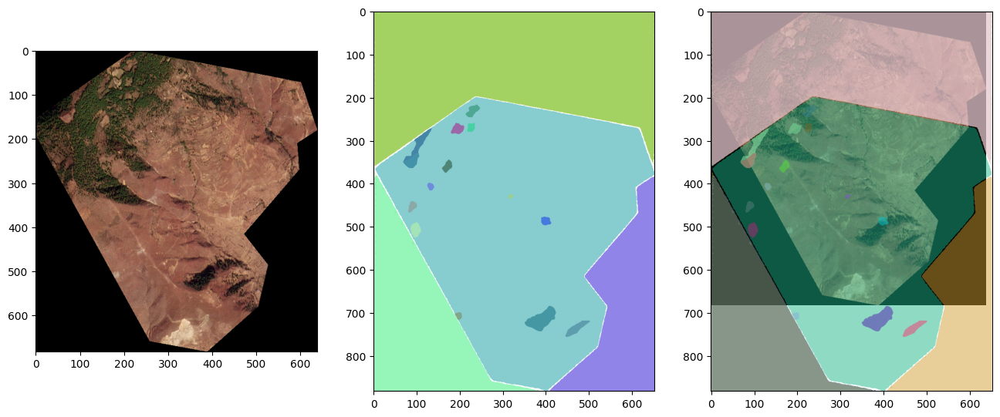

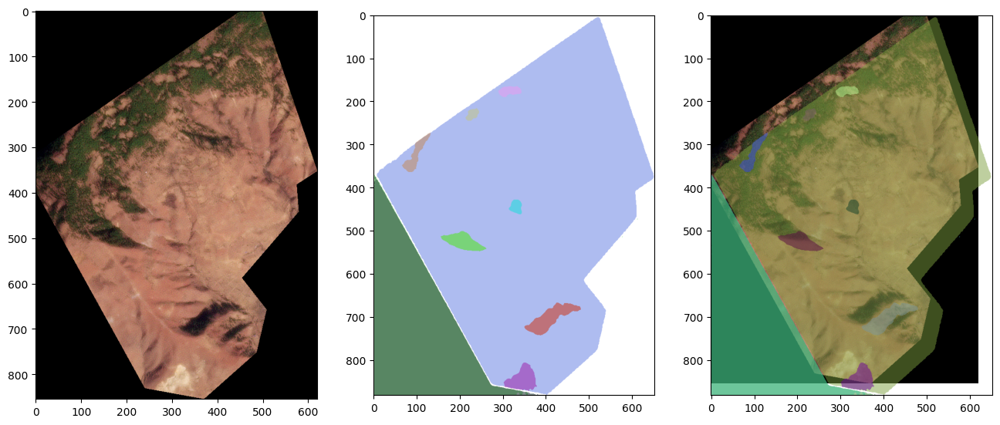

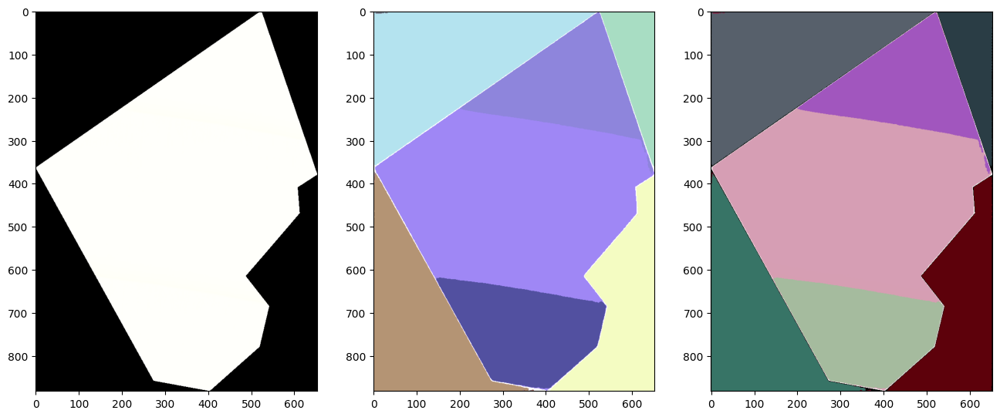

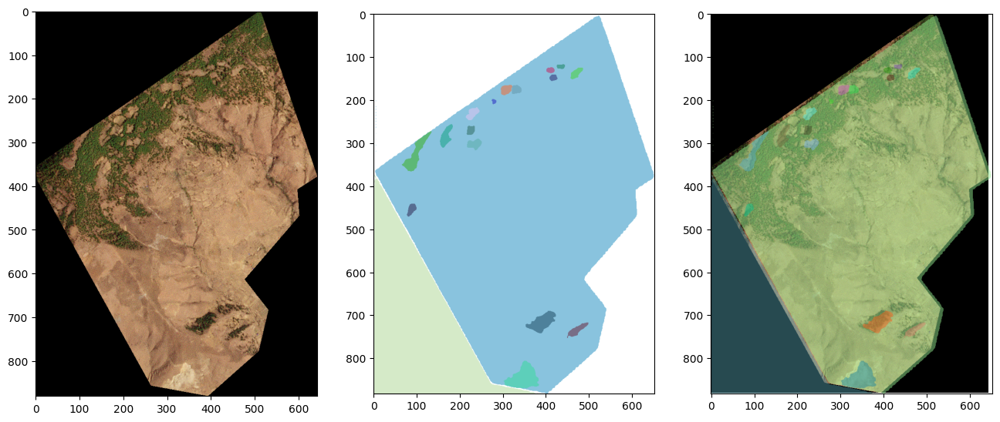

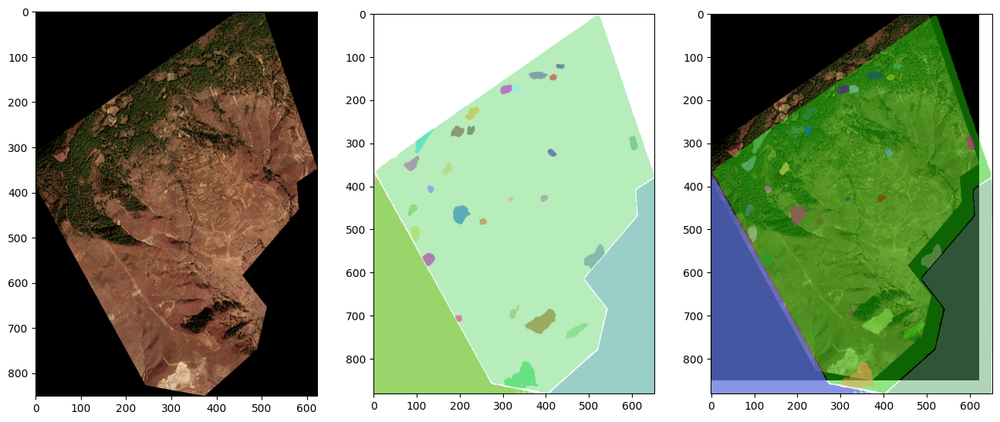

In [37]:
import os
import cv2
import matplotlib.pyplot as plt
import numpy as np

# Directory path
dir_path = "/home/idisc02/Saarland_Forest_monitoring_research/Reforestation_Monitoring/Plant_For_Planet_above200_dataset/polygon_7/1b146699-0721-4fc8-a15d-e7ce221cc7fd/PSScene"

# Get all .tif files in the directory
tif_files = [f for f in os.listdir(dir_path) if f.endswith('.tif')]

# Tolerance level for non-black pixels
tolerance = 100

# Only process the first 5 images
for i, tif_file in enumerate(tif_files[:5]):
    image_path = os.path.join(dir_path, tif_file)
    image_array = cv2.cvtColor(cv2.imread(image_path), cv2.COLOR_BGR2RGB)
    masks = mask_generator.generate(image_array)

    # Create a binary mask where pixels with small values are False
    mask = np.all(image_array < tolerance, axis=-1)

    # Find the bounding box of the non-black regions
    coords = np.argwhere(~mask)
    x_min, y_min = coords.min(axis=0)
    x_max, y_max = coords.max(axis=0)

    # Crop the image to this bounding box
    cropped_image_array = image_array[x_min:x_max+1, y_min:y_max+1]

    _, axes = plt.subplots(1,3, figsize=(16,16))
    axes[0].imshow(cropped_image_array)
    show_anns(masks, axes[1])
    axes[2].imshow(cropped_image_array)
    show_anns(masks, axes[2])
    plt.show()

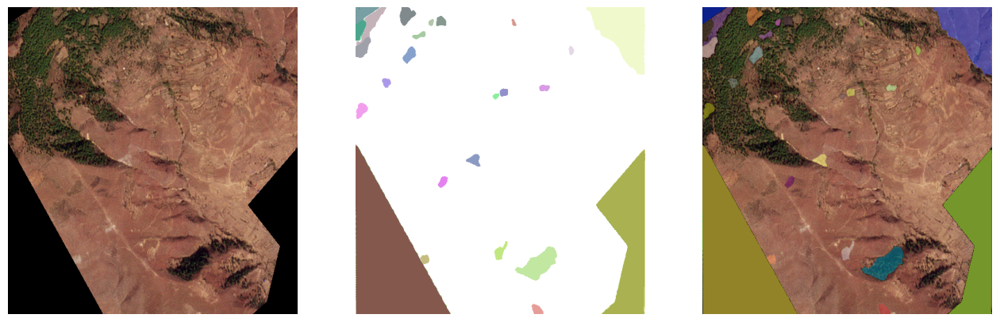

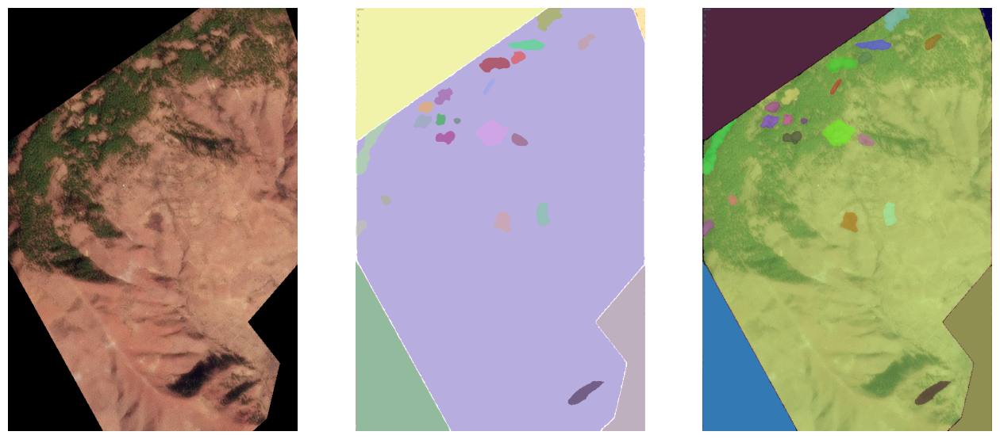

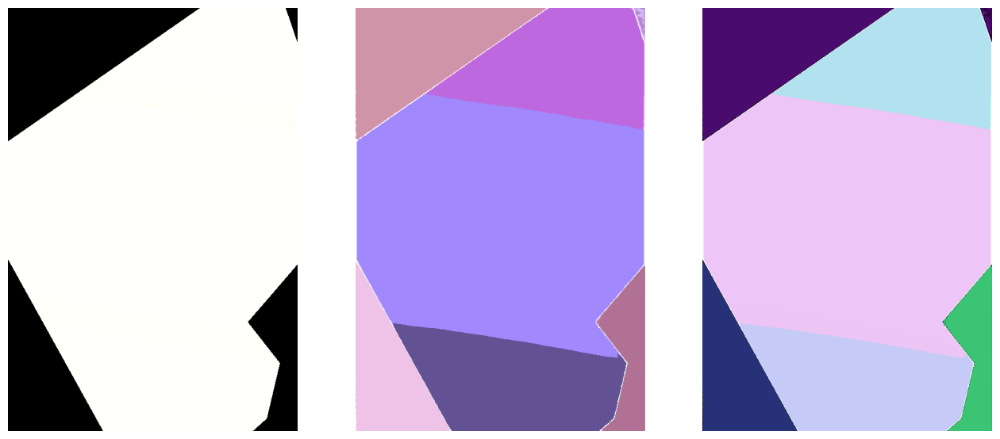

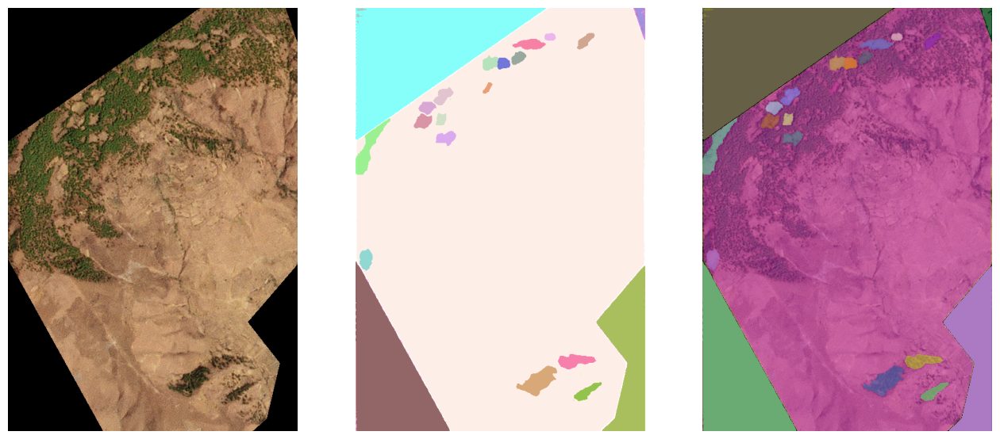

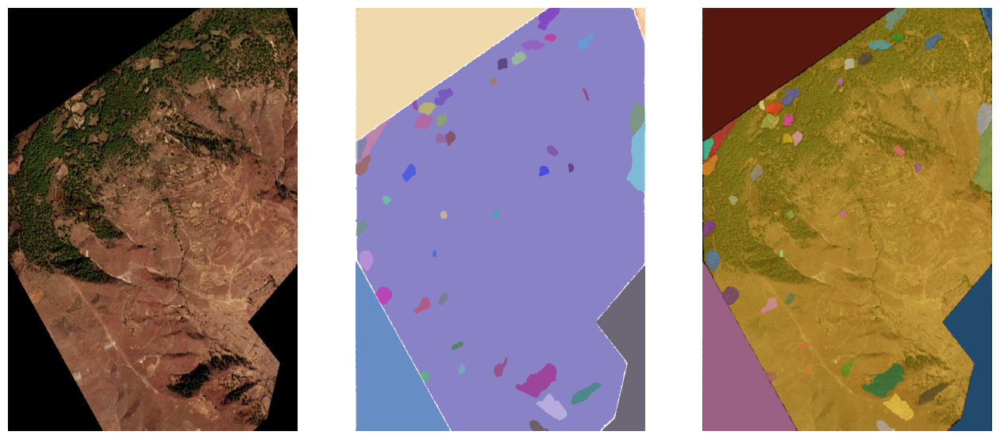

In [38]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Directory path
dir_path = "/home/idisc02/Saarland_Forest_monitoring_research/Reforestation_Monitoring/Plant_For_Planet_above200_dataset/polygon_7/1b146699-0721-4fc8-a15d-e7ce221cc7fd/PSScene"

# Get all .tif files in the directory
tif_files = [f for f in os.listdir(dir_path) if f.endswith('.tif')]

# Define the offset (increase this value to zoom in more)
offset = 80

# Only process the first 5 images
for i, tif_file in enumerate(tif_files[:5]):
    image_path = os.path.join(dir_path, tif_file)
    image_array = cv2.cvtColor(cv2.imread(image_path), cv2.COLOR_BGR2RGB)
    
    # Find where the image is not black
    coords = np.argwhere(np.all(image_array != [0, 0, 0], axis=-1))

    # Find the bounding box of those pixels
    x_min, y_min = coords.min(axis=0)
    x_max, y_max = coords.max(axis=0)  

    # Add the offset to the coordinates
    x_min += offset
    y_min += offset
    x_max -= offset
    y_max -= offset

    # Crop the image to that bounding box
    roi = image_array[x_min:x_max, y_min:y_max]

    masks = mask_generator.generate(roi)

    fig, axes = plt.subplots(1,3, figsize=(16,16))

    axes[0].imshow(roi)
    axes[0].axis('off')
    show_anns(masks, axes[1])
    axes[1].axis('off')
    axes[2].imshow(roi)
    axes[2].axis('off')
    show_anns(masks, axes[2])
    plt.show()

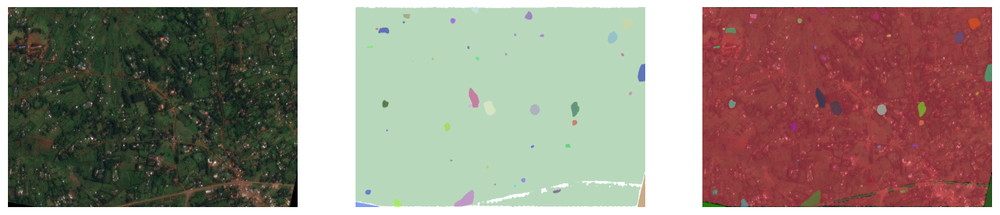

In [39]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

image_path = '/home/idisc02/Saarland_Forest_monitoring_research/Reforestation_Monitoring/polygon_62/1a07247a-6b9c-4643-84d2-a83903a376af/PSScene/20230618_071032_96_2464_3B_Visual_clip.tif'
image_array = cv2.cvtColor(cv2.imread(image_path), cv2.COLOR_BGR2RGB)

# Define the offset (increase this value to zoom in more)
offset = 100

# Find where the image is not black
coords = np.argwhere(np.all(image_array != [0, 0, 0], axis=-1))

# Find the bounding box of those pixels
x_min, y_min = coords.min(axis=0)
x_max, y_max = coords.max(axis=0)  

# Add the offset to the coordinates
x_min += offset
y_min += offset
x_max -= offset
y_max -= offset

# Crop the image to that bounding box
roi = image_array[x_min:x_max, y_min:y_max]

masks = mask_generator.generate(roi)

_, axes = plt.subplots(1,3, figsize=(16,16))
axes[0].imshow(roi)
axes[0].axis('off')
show_anns(masks, axes[1])
axes[1].axis('off')
axes[2].imshow(roi)
axes[2].axis('off')
show_anns(masks, axes[2])
plt.show()

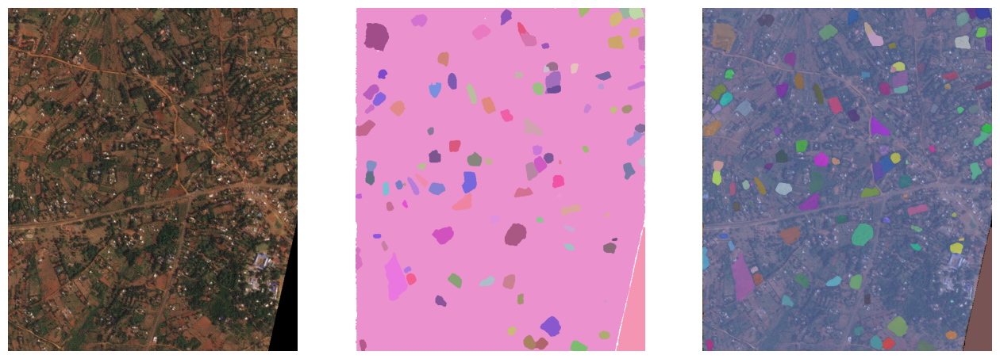

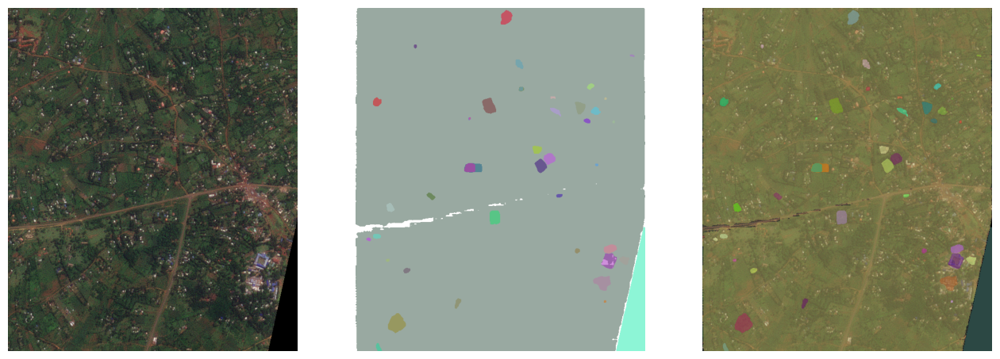

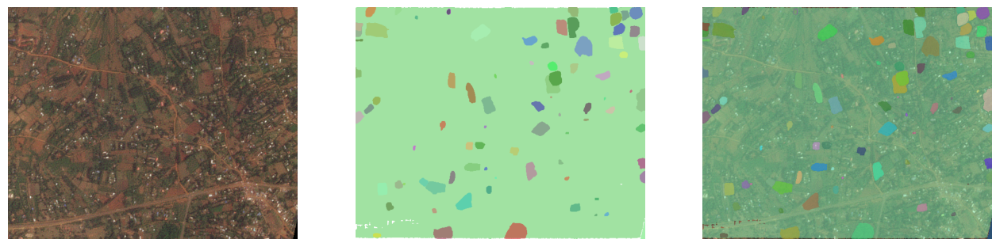

Skipping 20230104_074450_81_2481_3B_Visual_clip.tif because it's completely black.


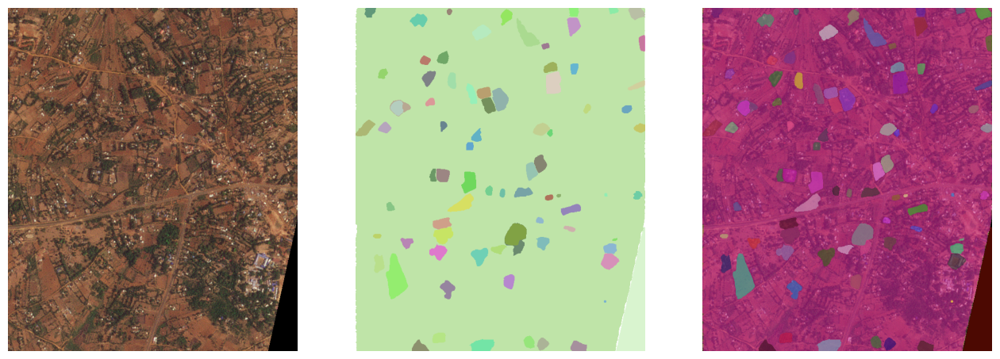

In [40]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Directory path
dir_path = "/home/idisc02/Saarland_Forest_monitoring_research/Reforestation_Monitoring/Plant_For_Planet_above200_dataset/polygon_62/7d2fd6f0-6a24-4465-829b-0b23b50f8dc2/PSScene"

# Get all .tif files in the directory
tif_files = [f for f in os.listdir(dir_path) if f.endswith('.tif')]

# Define the offset (increase this value to zoom in more)
offset = 120

# Only process the first 5 images
for i, tif_file in enumerate(tif_files[:5]):
    image_path = os.path.join(dir_path, tif_file)
    image_array = cv2.cvtColor(cv2.imread(image_path), cv2.COLOR_BGR2RGB)
    
    # Find where the image is not black
    coords = np.argwhere(np.all(image_array != [0, 0, 0], axis=-1))

    # If the image is completely black, skip it
    if coords.size == 0:
        print(f"Skipping {tif_file} because it's completely black.")
        continue

    # Find the bounding box of those pixels
    x_min, y_min = coords.min(axis=0)
    x_max, y_max = coords.max(axis=0)  

    # Add the offset to the coordinates
    x_min += offset
    y_min += offset
    x_max -= offset
    y_max -= offset

    # Crop the image to that bounding box
    roi = image_array[x_min:x_max, y_min:y_max]

    masks = mask_generator.generate(roi)

    _, axes = plt.subplots(1,3, figsize=(16,16))
    axes[0].imshow(roi)
    axes[0].axis('off')
    show_anns(masks, axes[1])
    axes[1].axis('off')
    axes[2].imshow(roi)
    axes[2].axis('off')
    show_anns(masks, axes[2])
    plt.show()

In [47]:
del(mask_generator)

# Object masks from prompts with SAM

https://github.com/facebookresearch/segment-anything/blob/main/notebooks/predictor_example.ipynb

In [28]:
from segment_anything import sam_model_registry, SamPredictor

predictor = SamPredictor(sam)

# Selecting objects with SAM


## Specifying a specific object with points

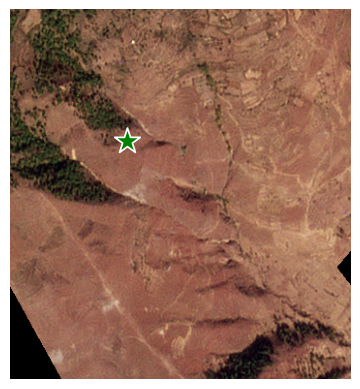

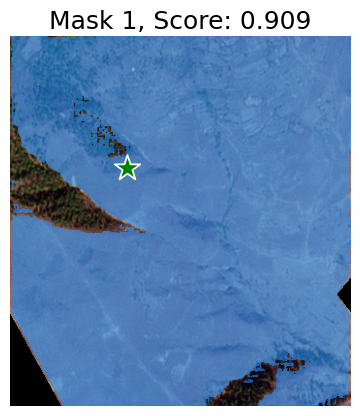

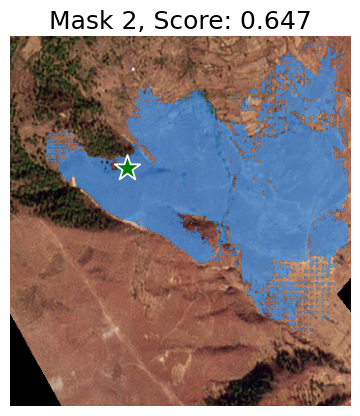

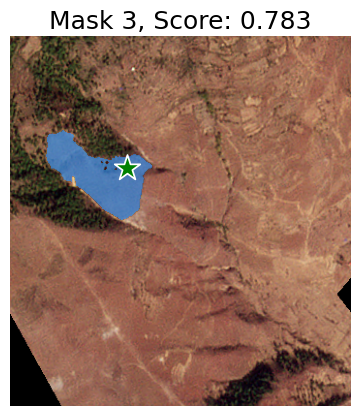

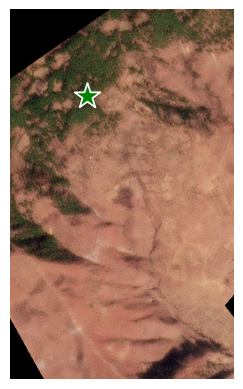

...

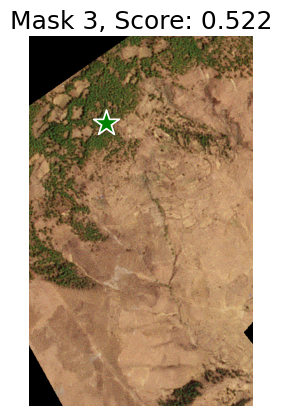

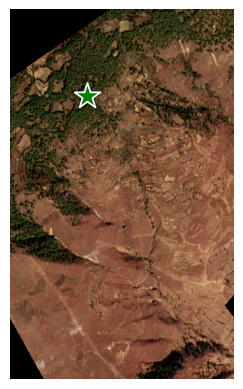

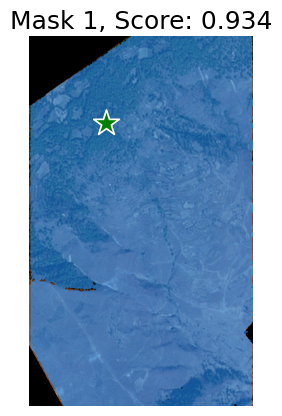

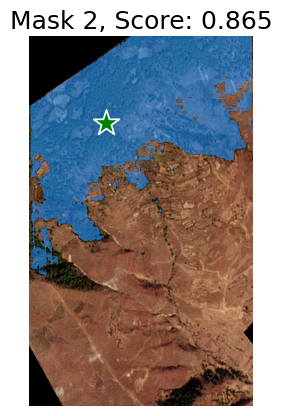

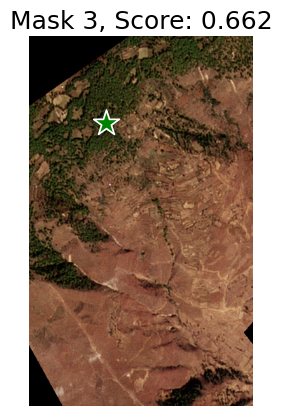

In [41]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Directory path
dir_path = "/home/idisc02/Saarland_Forest_monitoring_research/Reforestation_Monitoring/Plant_For_Planet_above200_dataset/polygon_7/1b146699-0721-4fc8-a15d-e7ce221cc7fd/PSScene"

# Get all .tif files in the directory
tif_files = [f for f in os.listdir(dir_path) if f.endswith('.tif')]

# Input point and label
input_point = np.array([[120, 135]])
input_label = np.array([1])

# Define the offset (increase this value to zoom in more)
offset = 150

# Only process the first 5 images
for i, tif_file in enumerate(tif_files[:5]):
    image_path = os.path.join(dir_path, tif_file)
    image_array = cv2.cvtColor(cv2.imread(image_path), cv2.COLOR_BGR2RGB)
    
    # Find where the image is not black
    coords = np.argwhere(np.all(image_array != [0, 0, 0], axis=-1))

    # If the image is completely black, skip it
    if coords.size == 0:
        print(f"Skipping {tif_file} because it's completely black.")
        continue

    # Find the bounding box of those pixels
    x_min, y_min = coords.min(axis=0)
    x_max, y_max = coords.max(axis=0)  

    # Add the offset to the coordinates
    x_min += offset
    y_min += offset
    x_max -= offset
    y_max -= offset

    # Crop the image to that bounding box
    roi = image_array[x_min:x_max, y_min:y_max]

    predictor.set_image(roi)

    plt.imshow(roi)
    show_points(input_point, input_label, plt.gca())
    plt.axis('off')
    plt.show()

    masks, scores, logits = predictor.predict(
        point_coords=input_point,
        point_labels=input_label,
        multimask_output=True,
    )

    for i, (mask, score) in enumerate(zip(masks, scores)):
        plt.imshow(roi)
        show_mask(mask, plt.gca())
        show_points(input_point, input_label, plt.gca())
        plt.title(f"Mask {i+1}, Score: {score:.3f}", fontsize=18)
        plt.axis('off')
        plt.show()

## Specifying a specific object with additional points (include and exclude)

Follow this notebook for additional prompting options:

https://github.com/facebookresearch/segment-anything/blob/main/notebooks/predictor_example.ipynb

Clustering

In [45]:
pip install natsort

Note: you may need to restart the kernel to use updated packages.


In [46]:
# import useful packages
from sklearn.cluster import KMeans
import rasterio 
import numpy as np
import matplotlib.pyplot as plt
import natsort

# assign imagery filepath 
imagery_fp = "/home/idisc02/Saarland_Forest_monitoring_research/Reforestation_Monitoring/polygon_62/1a07247a-6b9c-4643-84d2-a83903a376af/PSScene/20230618_071035_06_2464_3B_Visual_clip.tif"

# open imagery
img = rasterio.open(imagery_fp)                                                                             

# read the image data
imagery = img.read()

# grab the number of bands in the image, naip images have four bands
nbands = imagery.shape[0]

# Find where the image is not black
coords = np.argwhere(np.any(imagery != 0, axis=0))

# If the image is completely black, print a message and stop
if coords.size == 0:
    print("The image is completely black.")
else:
    # Find the bounding box of those pixels
    x_min, y_min = coords.min(axis=0)
    x_max, y_max = coords.max(axis=0)  

    # Crop the image to that bounding box
    roi = imagery[:, x_min:x_max, y_min:y_max]

    # create an empty array in which each column will hold a flattened band
    flat_data = np.empty((roi.shape[1]*roi.shape[2], nbands))

    # loop through each band in the image and add to the data array
    for i in range(nbands):
        band = roi[i,:,:]
        flat_data[:, i] = band.flatten()  # use i instead of i-1 to avoid negative index

    # set up the kmeans classification by specifying the number of clusters 
    km = KMeans(n_clusters=4)
    # begin iteratively computing the position of the two clusters
    km.fit(flat_data)

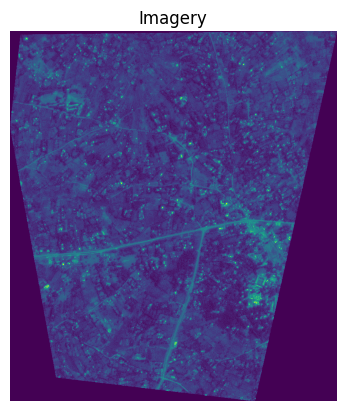

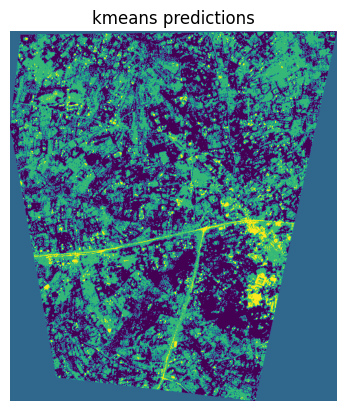

In [47]:
# use the sklearn kmeans .predict method to assign all the pixels of an image to a unique cluster
flat_predictions = km.predict(flat_data)

# rehsape the flattened precition array into an MxN prediction mask
prediction_mask = flat_predictions.reshape((roi.shape[1], roi.shape[2]))

#plot the imagery and the prediction mask for comparison

plt.imshow(roi[0,:,:])
plt.title("Imagery")
plt.axis('off')
plt.show()

plt.imshow(prediction_mask)
plt.title('kmeans predictions')
plt.axis('off')
plt.show()